<a href="https://colab.research.google.com/github/magourram/algo_mass_data/blob/main/proj_by_support.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Project 4: Plant leave recognizer
Using the «Prado Museum Pictures» dataset of Project 3, the task is to implement a deep-learning-based system classifying pictures according to any reasonable organization of classes (e.g., by author–selecting a manageable subset of authors, or by support). Note that the dataset does not directly contain the picture images, but these can be downloaded separately using the work_image_url attribute of the  prado.csv file.

- https://docs.google.com/document/d/1gsd5ZgMbbysU3OG1W1VL_SlPvMh8q-xjl7mffJ5xoBQ/edit#heading=h.qifoo7co6qtd



# Libraries

In [ ]:
import os
import time
import glob ##
import json

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.image import imread
import seaborn as sns
from PIL import Image
import shutil
from shutil import copyfile
import zipfile
import random
from tqdm import tqdm

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.utils import class_weight

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Conv2D, MaxPooling2D, Flatten, Dropout, Input, AveragePooling2D, concatenate
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import plot_model, to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers.experimental.preprocessing import Rescaling

!pip install keras-tuner --upgrade --quiet
import keras_tuner as kt
from keras_tuner import HyperModel, RandomSearch
from keras.metrics import AUC, Precision, Recall, Accuracy
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping ##
'''
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
'''
# Install kaggle
!pip install -q kaggle --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 850.2 kB/s eta 0:00:00


In [ ]:
'''
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
'''

'\nimport warnings\nwarnings.filterwarnings("ignore", category=DeprecationWarning)\n'

## Kaggle API

In [ ]:
start_time = time.time()

In [ ]:
# To be replaced with 'xxxxxx'
os.environ['KAGGLE_USERNAME'] = "XXXXXX"
os.environ['KAGGLE_KEY'] = "XXXXXX"

In [ ]:
# Create a new directory
new_directory_path = '/content/zip_file'
!mkdir "{new_directory_path}"

In [ ]:
# Download dataset files and locatet it in the directory
%cd /content/zip_file
!kaggle datasets download -d maparla/prado-museum-pictures

/content/zip_file
100% 24.9G/24.9G [08:10<00:00, 71.1MB/s]
100% 24.9G/24.9G [08:10<00:00, 54.6MB/s]


# Functions

In [ ]:
# Function to extract images from a zipped file [remove]
def extract_file(zip_file_path, extraction_path):
  with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extraction_path)
    path = os.path.join(extraction_path, 'images', 'images')
    print(f'The number of images in the folder is: {count_images_in_folder(path)}')

In [ ]:
# Remove directories even if not empty
def remove_non_empty_directory(directory_path):
    try:
        shutil.rmtree(directory_path)
        print(f"Directory '{directory_path}' and its contents have been successfully removed.")
    except Exception as e:
        print(f"Error: {e}")

In [ ]:
# Count the number of images in folder
def count_images_in_folder(folder_path):
    extensions = ['jpg', 'jpeg', 'png']  # Add more if needed

    # Use glob to get a list of files with specified extensions
    image_files = [file for ext in extensions for file in glob.glob(os.path.join(folder_path, f'*.{ext}'))]

    # Count the number of image files
    num_images = len(image_files)

    return num_images

In [ ]:
# Count the number of images in each subfolder after the re-allocation
def count_images_in_subfolders(root_folder, data_split):
    folder_path = os.path.join(root_folder, data_split)

    for subfolder in os.listdir(folder_path):
        subfolder_path = os.path.join(folder_path, subfolder)

        if os.path.isdir(subfolder_path):
            # Counting the number of files with extension ".jpg" in each subfolder
            num_images = len([file for file in os.listdir(subfolder_path) if file.lower().endswith('.jpg')])

            # Printing the results
            print(f"Subfolder '{subfolder}' in '{data_split}' contains {num_images} images.")

In [ ]:
# Function to plot images
def plot_images_from_folder(folder, num_cols=2):
    # Get a list of subfolders in the train folder
    subfolders = [f.path for f in os.scandir(folder) if f.is_dir()]

    # Calculate number of rows required
    num_rows = (len(subfolders) + num_cols - 1) // num_cols

    # Set up the subplot grid
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))

    # Flatten the axes array to make it easier to iterate
    axes = axes.flatten()

    # Plot one image from each subfolder
    for i, subfolder in enumerate(subfolders):
        # Get the list of images in the subfolder
        images = [f.path for f in os.scandir(subfolder) if f.is_file() and f.name.lower().endswith(('.png', '.jpg', '.jpeg'))]

        # Plot the first image in the subfolder
        if images:
            img_path = images[0]
            img = mpimg.imread(img_path)

            # Extract subfolder name from the path for the plot title
            subfolder_name = os.path.basename(subfolder)

            # Plot the image
            axes[i].imshow(img)
            axes[i].set_title(subfolder_name)
            axes[i].axis('off')  # Turn off axis labels

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.show()

### Zip Extraction

In [ ]:
# Set the path to zip file
zip_file_path = '/content/zip_file/prado-museum-pictures.zip'

# Set the path for the zip extraction
extraction_path = '/content/zip_file'
os.makedirs(extraction_path, exist_ok=True)

# Extract images using function
extract_file(zip_file_path, extraction_path)

The number of images in the folder is: 13472


### Accessing csv file

In [ ]:
# Reading the dataframe and make it accessible
extraction_path = "/content/zip_file"
df_ = pd.read_csv(os.path.join(extraction_path, "prado.csv"))

df_["work_id"] = df_['work_image_url'].apply(lambda x: x.split('/')[-1])

for _, row in df_.iterrows():
    image_id = row["work_id"]
    image_path = os.path.join("images", image_id)

# Remove unneccesary columns
columns_to_drop = [0, 1, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]
df_.drop(columns=df_.columns[columns_to_drop], inplace=True)

In [ ]:
# Plot the generic information about the dataframe
df_.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13487 entries, 0 to 13486
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   author                   13487 non-null  object
 1   author_id                12360 non-null  object
 2   technical_sheet_tecnica  13390 non-null  object
 3   work_id                  13487 non-null  object
dtypes: object(4)
memory usage: 421.6+ KB


### Analysis of the support

In [ ]:
# Extract the main types of support used
df_['support'] = df_['technical_sheet_tecnica'].apply(lambda x: str(x).split(';')[0] if pd.notna(x) and ';' in str(x) else str(x))

# Create a copy of the original dataframe and remove empty cells from author_id
df_ = df_.dropna(subset=['support'])

# Create a new column 'total_occurrences' based on 'author_id' counts for EDA purposes
df_['total_occurrences'] = df_['support'].map(df_['support'].value_counts())

df_

,author,author_id,technical_sheet_tecnica,work_id,support,total_occurrences
0,"Bayeu y Subías, Francisco",b218fee4-053b-4656-8577-9aa001ad1989,Lápiz negro,404387d6-a52c-4477-b598-de2a2d5a3d55.jpg,Lápiz negro,440
1,"Crespi, Giuseppe Maria",b20a5ee9-2ebd-4e60-aadc-e91e7867cb12,Sanguina,589ee4a3-28fa-4977-a84d-7326f5c9aeb3.jpg,Sanguina,394
2,"Cronenburch, Adriaen van",26861819-ff88-4fde-8a37-56db9e1c1ba4,Óleo,4a8bab74-ca91-450a-b5b7-39dd61e2d7f3.jpg,Óleo,4166
3,"González Velázquez, Zacarías",a8c659ad-d887-4703-8af3-1832dfc88eb7,Óleo,9af5b176-b4d3-4930-854b-5b5f252829f1.jpg,Óleo,4166
4,"Obra copiada de Cano de la Peña, Eduardo",521b82d6-6848-4f7d-96dc-3b8f102dd8b5,Óleo,4c494f0a-d5ae-45ca-826b-59f4b5fd4398.jpg,Óleo,4166
...,...,...,...,...,...,...
13482,"Atribuido Falck, Jeremías",d351c3c1-e89b-49cf-900d-24085ed1908f,Aguafuerte; Buril; Estampa iluminada,c62f7f3e-3ad3-4d9e-9586-b0b389b2d032.jpg,Aguafuerte,415
13483,"Atribuido Kiyonobu, Tori",9e420297-9fb9-4ef3-b128-96596d5dc191,Entalladura [madera a la fibra],6c28accf-e0c0-4bc0-b4c6-3fbb282bcbd8.jpg,Entalladura [madera a la fibra],23
13484,"García, Sergio",d984cdeb-020c-41f9-ae68-3285aebfa25a,"Aguada de pigmentos opacos [gouache, témpera];...",b4126fb6-c5ac-40e3-89a1-d1578914c09b.jpg,"Aguada de pigmentos opacos [gouache, témpera]",164
13485,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Gelatina / Colodión,e7bf2481-522c-4071-9d97-7908aca45831.jpg,Gelatina / Colodión,149


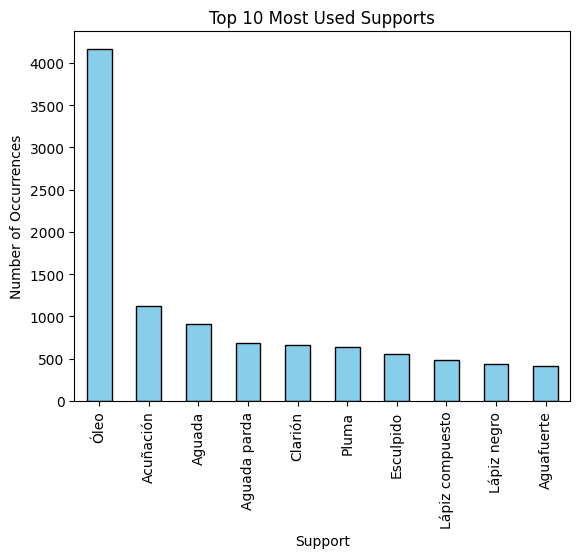

In [ ]:
# Get the 10 most recurrent supports
top_supports = df_['support'].value_counts().head(10)

# Plotting the histogram
top_supports.plot(kind='bar', color='skyblue', edgecolor='black')

# Adding labels and title
plt.xlabel('Support')
plt.ylabel('Number of Occurrences')
plt.title('Top 10 Most Used Supports')

# Show the plot
plt.show()

In [ ]:
df_support = df_[['technical_sheet_tecnica', 'support', 'total_occurrences']].drop_duplicates(subset='support').reset_index(drop=True)
df_support

,technical_sheet_tecnica,support,total_occurrences
0,Lápiz negro,Lápiz negro,440
1,Sanguina,Sanguina,394
2,Óleo,Óleo,4166
3,Lápiz,Lápiz,282
4,Aguada; Albayalde; Pluma,Aguada,909
...,...,...,...
108,Hierros dorados,Hierros dorados,1
109,Papel baritado,Papel baritado,1
110,Patinado,Patinado,1
111,Técnicas téxtiles,Técnicas téxtiles,2


### Setting up sample of images (support)

In [ ]:
# Filter rows with 'total_occurrences' at least minimum_img (number of images per author)
minimum_img_support = 500 #to be adjusted number of images for each author
df_support_final = df_support[df_support['total_occurrences'] >= minimum_img_support].reset_index(drop=True)
df_support_final

,technical_sheet_tecnica,support,total_occurrences
0,Óleo,Óleo,4166
1,Aguada; Albayalde; Pluma,Aguada,909
2,Acuñación,Acuñación,1120
3,Pluma; Tinta parda,Pluma,633
4,Clarión; Lápiz negro,Clarión,663
5,Aguada parda; Lápiz negro; Pluma,Aguada parda,681
6,Esculpido,Esculpido,558


In [ ]:
# Settings
total_number_classes_support = len(df_support_final) #depending on minimum_img
print("Number of rows in the DataFrame:", total_number_classes_support)

Number of rows in the DataFrame: 7


In [ ]:
# Train to be adjusted; val and test same ratio
train_ratio = 0.6
val_ratio = round((1 - train_ratio)/2,2)
test_ratio = round(1 - train_ratio - val_ratio,2)

In [ ]:
# Results after setting (macro level)
print("Total images at disposable:", total_number_classes_support * minimum_img_support, "\n")
print("Images used in training:", total_number_classes_support * minimum_img_support * train_ratio)
print("Images used in validation:", total_number_classes_support * minimum_img_support * val_ratio)
print("Images used in test:", total_number_classes_support * minimum_img_support * test_ratio, "\n")

# Results after setting (micro level)
print("Images in each training class:", (total_number_classes_support * minimum_img_support * train_ratio) / total_number_classes_support)
print("Images in each validation class:", (total_number_classes_support * minimum_img_support * val_ratio) / total_number_classes_support)
print("Images in each test class:", (total_number_classes_support * minimum_img_support * test_ratio) / total_number_classes_support)

Total images at disposable: 3500 

Images used in training: 2100.0
Images used in validation: 700.0
Images used in test: 700.0 

Images in each training class: 300.0
Images in each validation class: 100.0
Images in each test class: 100.0


### Classes definition

In [ ]:
# Classes names obtained from previous calculation
classes_names_support = df_support_final['support'].tolist()
print(classes_names_support)

['Óleo', 'Aguada', 'Acuñación', 'Pluma', 'Clarión', 'Aguada parda', 'Esculpido']


### Extraction of images and check existence for consistency

In [ ]:
np.random.seed(42)

# Initialize an empty DataFrame to store the sampled rows
result_support_df = pd.DataFrame()

# Loop through each ID in the list
for supp in classes_names_support:
    # Sample all available rows for each ID
    all_rows_supp = df_[df_['support'] == supp]

    # Extract work_id from all sampled rows
    work_ids_supp = all_rows_supp['work_id'].tolist()

    # Check if related images exist in another folder
    existing_work_ids_supp = [work_id for work_id in work_ids_supp if os.path.exists(f"/content/zip_file/images/images/{work_id}")]

    # If there are more than minimum_img existing images, sample 100 randomly
    if len(existing_work_ids_supp) >= minimum_img_support:
        sampled_work_ids_supp = np.random.choice(existing_work_ids_supp, size=minimum_img_support, replace=False)
    else:
        # If there are fewer than minimum_img existing images, sample with replacement
        sampled_work_ids_supp = np.random.choice(existing_work_ids_supp, size=minimum_img_support, replace=False)

    # Filter rows based on the sampled work_ids
    sampled_rows_supp = all_rows_supp[all_rows_supp['work_id'].isin(sampled_work_ids_supp)]

    # Use pandas.concat instead of append
    result_support_df = pd.concat([result_support_df, sampled_rows_supp], ignore_index=True)

result_support_df = result_support_df.sample(frac=1, random_state=42).reset_index(drop=True)

result_support_df

,author,author_id,technical_sheet_tecnica,work_id,support,total_occurrences
0,"Ribera y Fieve, Carlos Luis de",5e2996c9-53ec-4b75-ac76-eb4ead2cf6c0,Pluma; Tinta parda; Lápiz compuesto,a37663cd-693f-4d1d-a627-07b3811f37bd.jpg,Pluma,633
1,"Bayeu y Subías, Francisco",b218fee4-053b-4656-8577-9aa001ad1989,Clarión; Sanguina,877f9c79-278b-4d4a-9e45-05af8ccbd515.jpg,Clarión,663
2,"López Portaña, Vicente",8caad4ee-a045-43f8-8c06-9e45623a9d84,Clarión; Lápiz negro; Sanguina,2e0fe2ba-10d6-4b6f-9e89-626ff71e1f01.jpg,Clarión,663
3,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Pluma,31e952e7-a5f5-4a23-b5cb-4ecb0e5838ca.jpg,Pluma,633
4,"López Portaña, Vicente",8caad4ee-a045-43f8-8c06-9e45623a9d84,Óleo,fcb4b4fc-0210-4405-82f8-7df3c82bd7ee.jpg,Óleo,4166
...,...,...,...,...,...,...
3495,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Acuñación,8a47e82c-dd17-41c6-af15-39cb9a5d43cc.jpg,Acuñación,1120
3496,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Acuñación,7e90eb06-99fa-47d3-a9aa-c6e5f66b7b22.jpg,Acuñación,1120
3497,"Maura y Montaner, Bartolomé",3c6f515b-f504-4ffa-aaf7-03e338681832,Acuñación,2de382ec-1aef-4098-b2b3-c5cdcb9c4e9d.jpg,Acuñación,1120
3498,"Rodríguez, Antonio",74d8c990-391c-42c3-a8af-35d815498c4f,Aguada; Lápiz negro; Pincel; Tinta de hollín; ...,1a602996-bfdf-4110-9e95-fc7aded37279.jpg,Aguada,909


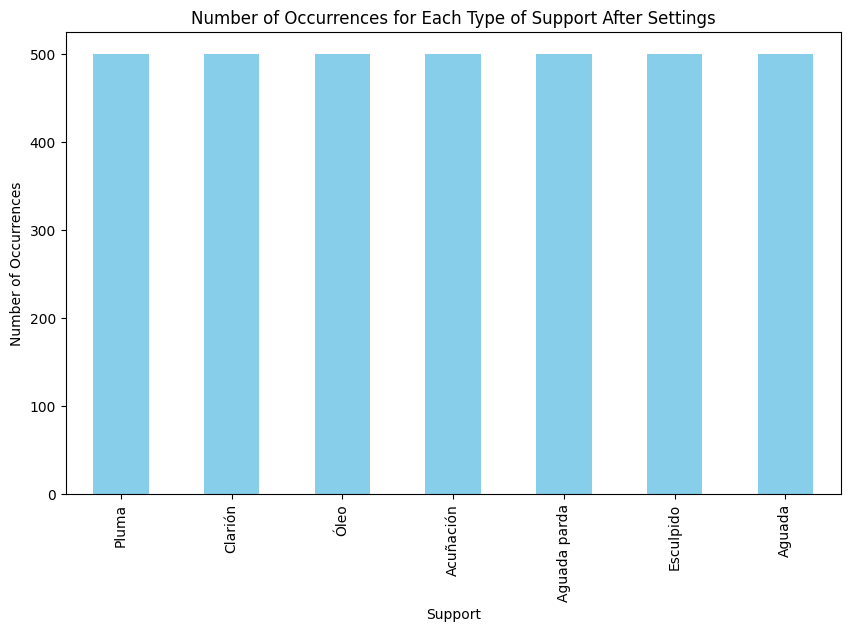

In [ ]:
# Extract list of the useful id related to images
support_list = result_support_df['work_id'].to_list()
len(support_list)

# Count the occurrences of each author in result_df
support_counts = result_support_df['support'].value_counts()

# Plot the histogram
plt.figure(figsize=(10, 6))
support_counts.plot(kind='bar', color='skyblue')
plt.title('Number of Occurrences for Each Type of Support After Settings')
plt.xlabel('Support')
plt.ylabel('Number of Occurrences')
plt.show()

In [ ]:
# Loop through the work_ids list and check if all file exists
for file_name in support_list:
    file_path = os.path.join(extraction_path, 'images', 'images', file_name)

    if not os.path.exists(file_path):
        print(f"File {file_name} does not exist in the directory.")

# If you prefer a boolean result indicating whether all files are present:
all_files_exist_support = all(os.path.exists(os.path.join(extraction_path, 'images', 'images', file_name)) for file_name in work_ids_supp)
print(f"All files exist? {all_files_exist_support}")

All files exist? True


In [ ]:
# Creating a dataframe with the data related to the work_id_list
result_support_df_final = result_support_df[result_support_df['work_id']==support_list]

# Add a column with the path to the images
result_support_df_final['image_path'] = result_support_df_final['work_id'].apply(lambda filename: os.path.join(extraction_path, 'images', 'images', filename))
result_support_df_final

# Merge df with the one containing just the ten authors
#result_support_df_final = pd.merge(result_, df_merged_final, on='author_id').drop('author_x', axis=1).rename(columns={'author_y': 'author'})

,author,author_id,technical_sheet_tecnica,work_id,support,total_occurrences,image_path
0,"Ribera y Fieve, Carlos Luis de",5e2996c9-53ec-4b75-ac76-eb4ead2cf6c0,Pluma; Tinta parda; Lápiz compuesto,a37663cd-693f-4d1d-a627-07b3811f37bd.jpg,Pluma,633,/content/zip_file/images/images/a37663cd-693f-...
1,"Bayeu y Subías, Francisco",b218fee4-053b-4656-8577-9aa001ad1989,Clarión; Sanguina,877f9c79-278b-4d4a-9e45-05af8ccbd515.jpg,Clarión,663,/content/zip_file/images/images/877f9c79-278b-...
2,"López Portaña, Vicente",8caad4ee-a045-43f8-8c06-9e45623a9d84,Clarión; Lápiz negro; Sanguina,2e0fe2ba-10d6-4b6f-9e89-626ff71e1f01.jpg,Clarión,663,/content/zip_file/images/images/2e0fe2ba-10d6-...
3,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Pluma,31e952e7-a5f5-4a23-b5cb-4ecb0e5838ca.jpg,Pluma,633,/content/zip_file/images/images/31e952e7-a5f5-...
4,"López Portaña, Vicente",8caad4ee-a045-43f8-8c06-9e45623a9d84,Óleo,fcb4b4fc-0210-4405-82f8-7df3c82bd7ee.jpg,Óleo,4166,/content/zip_file/images/images/fcb4b4fc-0210-...
...,...,...,...,...,...,...,...
3495,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Acuñación,8a47e82c-dd17-41c6-af15-39cb9a5d43cc.jpg,Acuñación,1120,/content/zip_file/images/images/8a47e82c-dd17-...
3496,Anónimo,99d7590d-7ec8-4da4-bc2f-92064214c76c,Acuñación,7e90eb06-99fa-47d3-a9aa-c6e5f66b7b22.jpg,Acuñación,1120,/content/zip_file/images/images/7e90eb06-99fa-...
3497,"Maura y Montaner, Bartolomé",3c6f515b-f504-4ffa-aaf7-03e338681832,Acuñación,2de382ec-1aef-4098-b2b3-c5cdcb9c4e9d.jpg,Acuñación,1120,/content/zip_file/images/images/2de382ec-1aef-...
3498,"Rodríguez, Antonio",74d8c990-391c-42c3-a8af-35d815498c4f,Aguada; Lápiz negro; Pincel; Tinta de hollín; ...,1a602996-bfdf-4110-9e95-fc7aded37279.jpg,Aguada,909,/content/zip_file/images/images/1a602996-bfdf-...


### Moving images

In [ ]:
# Define the paths
source_folder = os.path.join(extraction_path, 'images', 'images')
output_folder_support = '/content/prado_support'
os.makedirs(output_folder_support, exist_ok=True)

# Set a random seed for replicability
random_seed = 42

# Create train, test, and validation splits
sss_test = StratifiedShuffleSplit(n_splits=1, test_size=test_ratio + val_ratio, random_state=random_seed)
for train_index, test_validation_index in sss_test.split(result_support_df_final, result_support_df_final['support']):
    train_df = result_support_df_final.iloc[train_index]
    test_validation_df = result_support_df_final.iloc[test_validation_index]

sss_validation = StratifiedShuffleSplit(n_splits=1, test_size= val_ratio / (test_ratio + val_ratio), random_state=random_seed)
for test_index, validation_index in sss_validation.split(test_validation_df, test_validation_df['support']):
    test_df = test_validation_df.iloc[test_index]
    validation_df = test_validation_df.iloc[validation_index]

# Create train, test, and validation folders
for split in ['train', 'test', 'validation']:
    split_folder = os.path.join(output_folder_support, split)
    os.makedirs(split_folder, exist_ok=True)

    # Create subfolders for each author
    for support in result_support_df_final['support'].unique():
        support_folder = os.path.join(split_folder, str(support))
        os.makedirs(support_folder, exist_ok=True)

# Move images to their respective folders
for split, current_df in zip(['train', 'test', 'validation'], [train_df, test_df, validation_df]):
    for index, row in current_df.iterrows():
        source_path = os.path.join(source_folder, row['work_id'])
        destination_path = os.path.join(output_folder_support, split, str(row['support']), os.path.basename(row['image_path']))
        shutil.copy(source_path, destination_path)

In [ ]:
# Count images in the "train" and "test" subfolders
print("---   TRAIN   ---")
count_images_in_subfolders(output_folder_support, "train")
print("---------------------")
print("---   VALIDATION   ---")
count_images_in_subfolders(output_folder_support, "validation")
print("---------------------")
print("---   TEST   ---")
count_images_in_subfolders(output_folder_support, "test")
print("---------------------")

---   TRAIN   ---
Subfolder 'Pluma' in 'train' contains 300 images.
Subfolder 'Aguada' in 'train' contains 300 images.
Subfolder 'Esculpido' in 'train' contains 300 images.
Subfolder 'Clarión' in 'train' contains 300 images.
Subfolder 'Óleo' in 'train' contains 300 images.
Subfolder 'Acuñación' in 'train' contains 300 images.
Subfolder 'Aguada parda' in 'train' contains 300 images.
---------------------
---   VALIDATION   ---
Subfolder 'Pluma' in 'validation' contains 100 images.
Subfolder 'Aguada' in 'validation' contains 100 images.
Subfolder 'Esculpido' in 'validation' contains 100 images.
Subfolder 'Clarión' in 'validation' contains 100 images.
Subfolder 'Óleo' in 'validation' contains 100 images.
Subfolder 'Acuñación' in 'validation' contains 100 images.
Subfolder 'Aguada parda' in 'validation' contains 100 images.
---------------------
---   TEST   ---
Subfolder 'Pluma' in 'test' contains 100 images.
Subfolder 'Aguada' in 'test' contains 100 images.
Subfolder 'Esculpido' in 'test

## Plot images

In [ ]:
train_path_supp = os.path.join(output_folder_support, 'train')
validation_path_supp = os.path.join(output_folder_support, 'validation')
test_path_supp = os.path.join(output_folder_support, 'test')

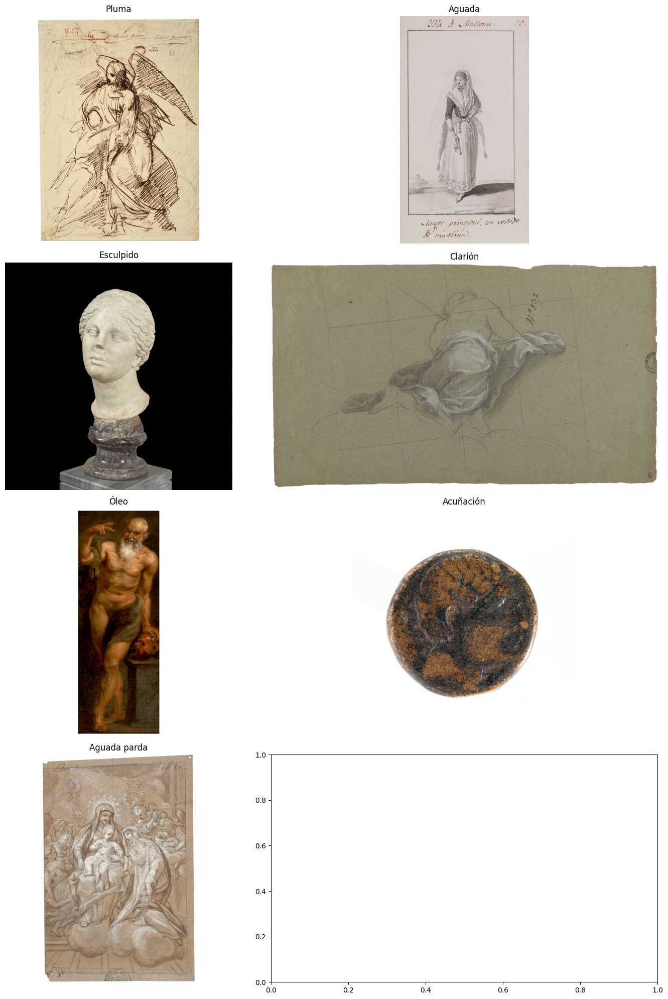

In [ ]:
#Train
plot_images_from_folder(train_path_supp)

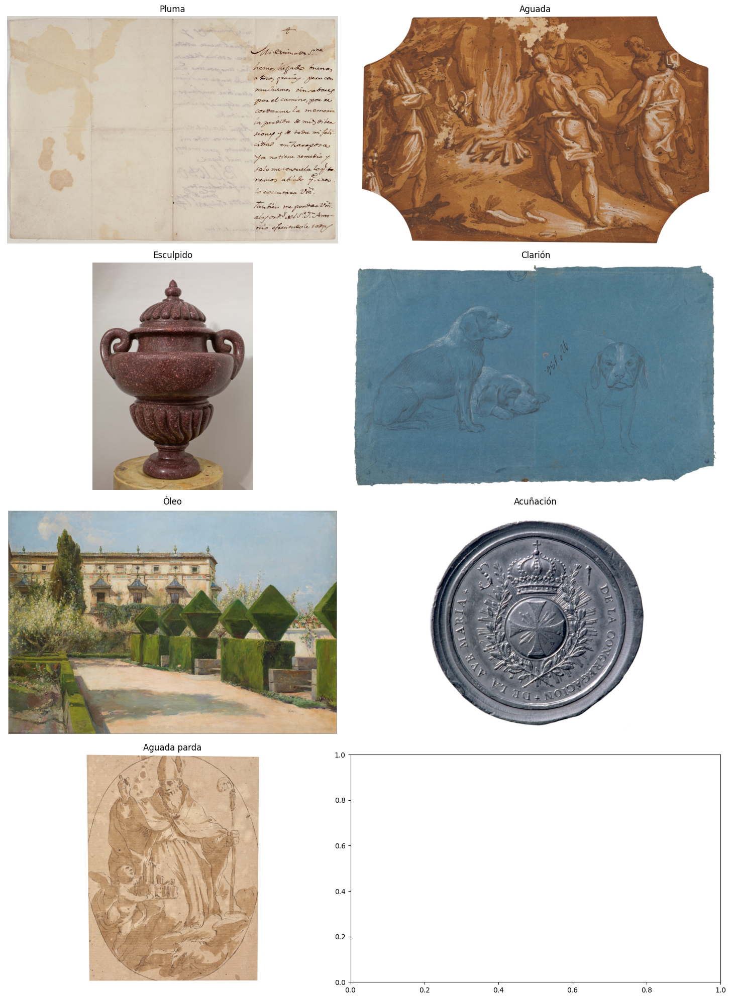

In [ ]:
#Test
plot_images_from_folder(validation_path_supp)

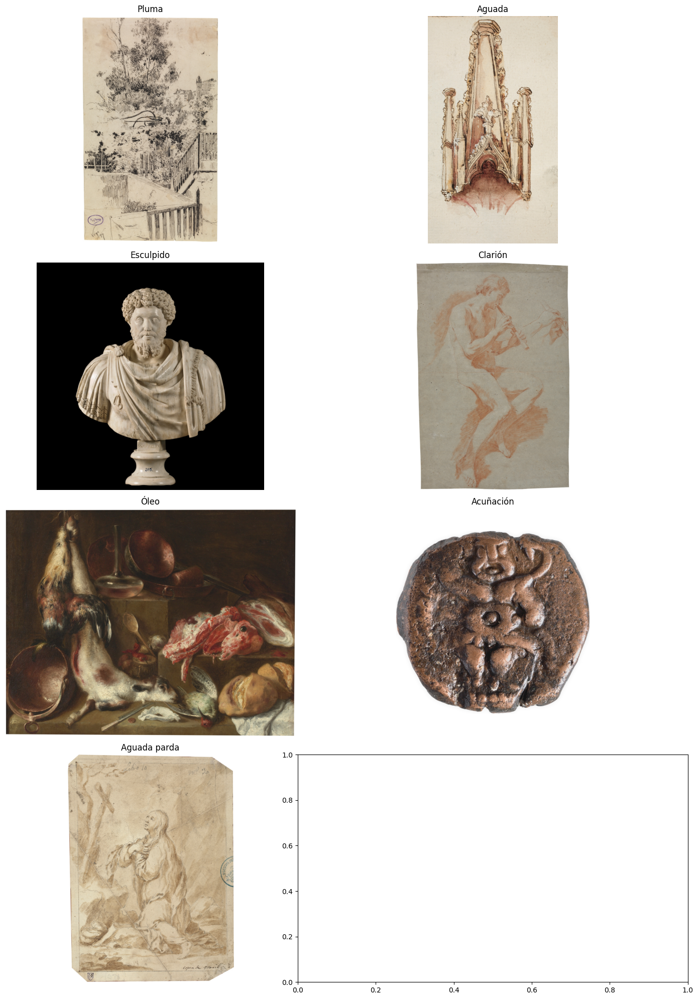

In [ ]:
#Validation
plot_images_from_folder(test_path_supp)

## Image processing

In [ ]:
HEIGHT = 64
WIDTH = 64
BATCH = 10
EPOCHS = 10

In [ ]:
train_data_supp = tf.keras.utils.image_dataset_from_directory(
    train_path_supp,
    image_size = (HEIGHT, WIDTH),
    interpolation='mitchellcubic',
    crop_to_aspect_ratio=True,
    seed=42,
    shuffle=True,
    batch_size=BATCH
    )

validation_data_supp = tf.keras.utils.image_dataset_from_directory(
    validation_path_supp,
    image_size = (HEIGHT, WIDTH),
    interpolation='mitchellcubic',
    crop_to_aspect_ratio=True,
    seed=42,
    shuffle=True,
    batch_size=BATCH
    )

test_data_supp = tf.keras.utils.image_dataset_from_directory(
    test_path_supp,
    image_size=(HEIGHT, WIDTH),
    interpolation='mitchellcubic',
    crop_to_aspect_ratio=True,
    seed=42,
    shuffle=True,
    batch_size=BATCH
)

Found 2100 files belonging to 7 classes.
Found 700 files belonging to 7 classes.
Found 700 files belonging to 7 classes.


In [ ]:
# Extraction of classes from tf.Dataset
classes_supp = train_data_supp.class_names
classes_supp

['Acuñación',
 'Aguada',
 'Aguada parda',
 'Clarión',
 'Esculpido',
 'Pluma',
 'Óleo']

In [ ]:
# Compute class weights
weights_class_supp = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(classes_supp),
    y=classes_supp)

weights_class_supp_ = dict(zip(np.unique(classes_supp), weights_class_supp))
weights_class_supp_dict = dict(enumerate(weights_class_supp))
weights_class_supp = {i: 1.0 for i in weights_class_supp_dict.keys()}
weights_class_supp_

{'Acuñación': 1.0,
 'Aguada': 1.0,
 'Aguada parda': 1.0,
 'Clarión': 1.0,
 'Esculpido': 1.0,
 'Pluma': 1.0,
 'Óleo': 1.0}

In [ ]:
# Processing image data from a training dataset and creating a DataFrame
data = []

for i, batch in enumerate(train_data_supp):
  inputs, targets = batch
  for j in range(inputs.shape[0]):
    image = inputs[j].numpy()
    image = (image * 255).astype(np.uint8)
    filename = f"batch_{i}_image_{j}.jpg"
    with Image.fromarray(image) as img:
      width, height = img.size
      data.append ({'filename': filename, 'width': width, 'height': height})

train_df_supp = pd.DataFrame(data)
train_df_supp.nunique()

filename    2100
width          1
height         1
dtype: int64

In [ ]:
# Processing image data from a validation dataset and creating a DataFrame
data = []

for i, batch in enumerate(validation_data_supp):
  inputs, targets = batch
  for j in range(inputs.shape[0]):
    image = inputs[j].numpy()
    image = (image * 255).astype(np.uint8)
    filename = f"batch_{i}_image_{j}.jpg"
    with Image.fromarray(image) as img:
      width, height = img.size
      data.append({'filename': filename, 'width': width, 'height': height})

validation_df_supp = pd.DataFrame(data)
validation_df_supp.nunique()

filename    700
width         1
height        1
dtype: int64

In [ ]:
# Processing image data from a testing dataset and creating a DataFrame
data = []

for i, batch in enumerate(test_data_supp):
  inputs, targets = batch
  for j in range(inputs.shape[0]):
    image = inputs[j].numpy()
    image = (image * 255).astype(np.uint8)
    filename = f"batch_{i}_image_{j}.jpg"
    with Image.fromarray(image) as img:
      width, height = img.size
      data.append({'filename': filename, 'width': width, 'height': height})

test_df_supp = pd.DataFrame(data)
test_df_supp.nunique()

filename    700
width         1
height        1
dtype: int64

## EDA

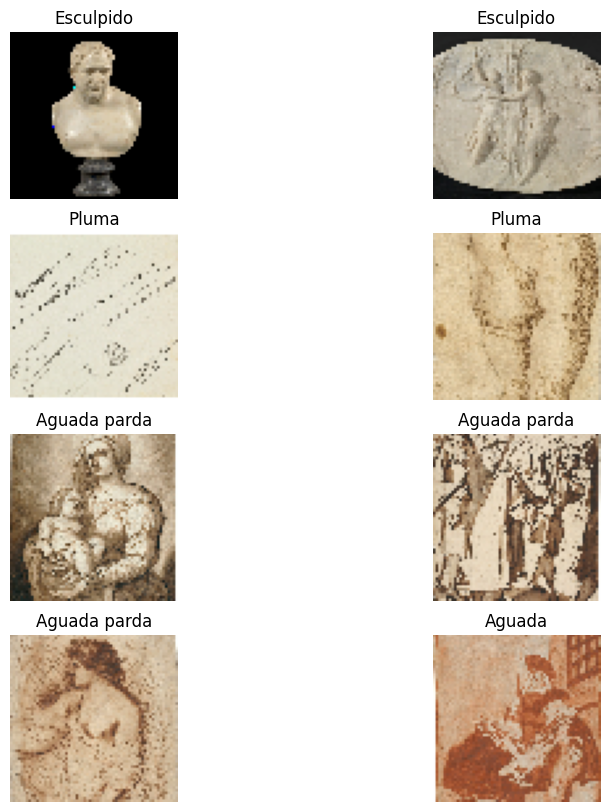

In [ ]:
# Plotting images from train data
plt.figure(figsize=(10,10))

for images, labels in train_data_supp.take(1):
  for i in range(8):
    ax = plt.subplot(4,2,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(classes_supp[labels[i]])
    plt.axis('off')

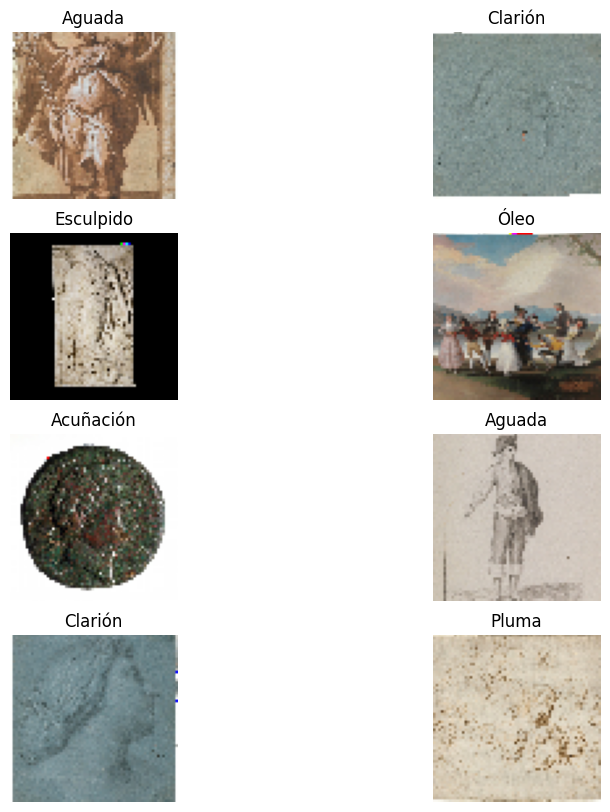

In [ ]:
# Plotting images from validation data
plt.figure(figsize=(10,10))

for images, labels in validation_data_supp.take(1):
  for i in range(8):
    ax = plt.subplot(4,2,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(classes_supp[labels[i]])
    plt.axis('off')

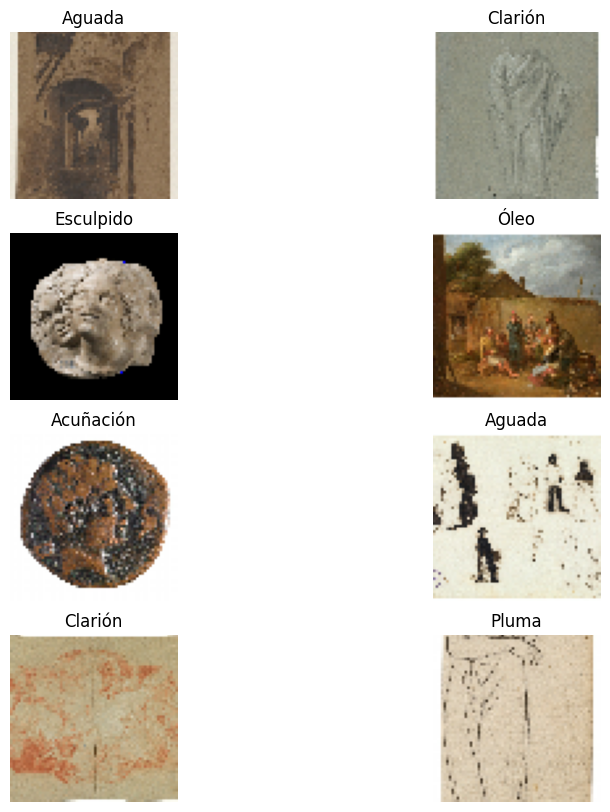

In [ ]:
# Plotting images from test data
plt.figure(figsize=(10,10))

for images, labels in test_data_supp.take(1):
  for i in range(8):
    ax = plt.subplot(4,2,i+1)
    plt.imshow(images[i].numpy().astype('uint8'))
    plt.title(classes_supp[labels[i]])
    plt.axis('off')

In [ ]:
# print the shape of the train batch of images and labels
for image_batch, labels_batch in train_data_supp:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(10, 64, 64, 3)
(10,)


In [ ]:
# print the shape of the validation batch of images and labels
for image_batch, labels_batch in validation_data_supp:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(10, 64, 64, 3)
(10,)


In [ ]:
# print the shape of the test batch of images and labels
for image_batch, labels_batch in test_data_supp:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(10, 64, 64, 3)
(10,)


## Model Preparation and Deployment

In [ ]:
# data augmentation pipeline
train_aug_supp = Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical",
                                                 input_shape = (HEIGHT, WIDTH, 3)), #random horizontal and vertical flips to the input images
    #layers.experimental.preprocessing.RandomZoom(height_factor=(-0.05, -0.15),width_factor=(-0.05, -0.15),fill_mode='nearest'), #layer introduces random zooming to the images and fills empty areas in zooms
    layers.RandomBrightness(0.2), #adjusts the brightness of the images
    layers.RandomContrast(0.2), #adjusts the contrast of the images
    #layers.RandomTranslation(0.05, 0.05), #random translations to the images in both the horizontal and vertical directions
    #layers.RandomRotation(0.2) #random rotations to the images
])

In [ ]:
# Dynamic tuning of performance-related parameters
AUTOTUNE = tf.data.AUTOTUNE

# Optimizing the data loading pipeline for training and validation by caching, shuffling, and prefetching the dataset elements
train_data_supp = train_data_supp.cache().shuffle(100, seed=random_seed).prefetch(buffer_size=AUTOTUNE)
validation_data_supp = validation_data_supp.cache().shuffle(100, seed=random_seed).prefetch(buffer_size=AUTOTUNE)

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

## Base model

In [ ]:
# Model definition
def base_model_supp():
  model = Sequential()
  model.add(train_aug_supp)
  model.add(layers.Conv2D(16, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())
  model.add(layers.Conv2D(32, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())
  model.add(layers.Conv2D(64, kernel_size = (3,3), padding = 'same', activation = 'relu'))
  model.add(layers.MaxPooling2D())
  model.add(layers.Flatten())
  model.add(layers.Dense(128, activation = 'relu'))
  model.add(layers.Dense(len(classes_supp)))

  model.compile(optimizer = keras.optimizers.Adam(learning_rate=0.001),
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics = ['accuracy'])

  return model

In [ ]:
b_model_supp = base_model_supp()
b_model_supp.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 64, 64, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 16)        448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 16, 16, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 64)       

In [ ]:
# Training
base_history_supp = b_model_supp.fit(train_data_supp,
                                     validation_data = validation_data_supp,
                                     epochs = EPOCHS,
                                     class_weight = weights_class_supp,
                                     callbacks=[early_stopping])

Epoch 1/10
210/210 [==============================] - 122s 352ms/step - loss: 2.5120 - accuracy: 0.5395 - val_loss: 1.0297 - val_accuracy: 0.5943
Epoch 2/10
210/210 [==============================] - 13s 60ms/step - loss: 0.9291 - accuracy: 0.6386 - val_loss: 0.8853 - val_accuracy: 0.6571
Epoch 3/10
210/210 [==============================] - 12s 59ms/step - loss: 0.7940 - accuracy: 0.6757 - val_loss: 0.8186 - val_accuracy: 0.6800
Epoch 4/10
210/210 [==============================] - 13s 60ms/step - loss: 0.7417 - accuracy: 0.7110 - val_loss: 0.8941 - val_accuracy: 0.6771
Epoch 5/10
210/210 [==============================] - 12s 59ms/step - loss: 0.7287 - accuracy: 0.7090 - val_loss: 0.8778 - val_accuracy: 0.6629
Epoch 6/10
210/210 [==============================] - 13s 61ms/step - loss: 0.7167 - accuracy: 0.7129 - val_loss: 0.7431 - val_accuracy: 0.7400
Epoch 7/10
210/210 [==============================] - 12s 59ms/step - loss: 0.6618 - accuracy: 0.7467 - val_loss: 0.7889 - val_accurac

<Axes: >

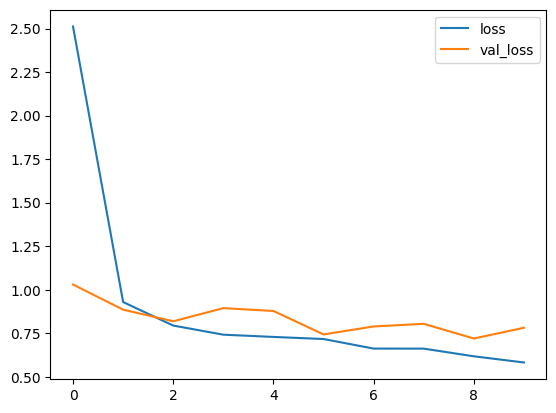

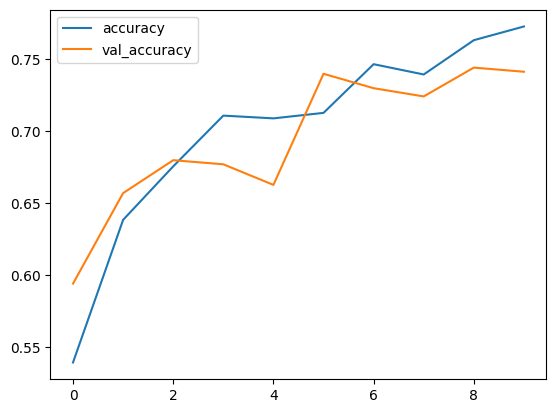

In [ ]:
# Plotting performance model
history_df_supp = pd.DataFrame(base_history_supp.history)
history_df_supp[['loss', 'val_loss']].plot()
history_df_supp[['accuracy', 'val_accuracy']].plot()

In [ ]:
# Prediction
trues = []
preds = []
for img, label in tqdm(test_data_supp):
  pred = b_model_supp.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

100%|██████████| 70/70 [00:40<00:00,  1.71it/s]


In [ ]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='macro'),3))
print("Recall score:", round(recall_score(trues, preds, average='macro', zero_division = 0),3))
print("Precision score:", round(precision_score(trues, preds, average='macro', zero_division = 0),3))

F1-Score: 0.687
Recall score: 0.706
Precision score: 0.745


In [ ]:
# Model loss value & metrics values in test mode
b_model_supp.evaluate(test_data_supp)

70/70 [==============================] - 21s 273ms/step - loss: 0.6740 - accuracy: 0.7514


[0.6740058064460754, 0.7514285445213318]

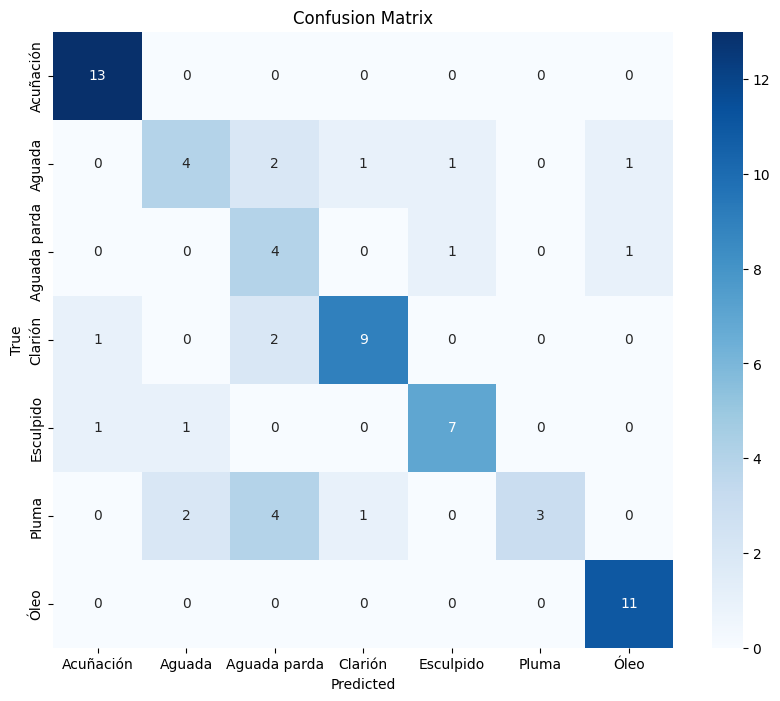

In [ ]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes_supp, yticklabels=classes_supp)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [ ]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     0.8667    1.0000    0.9286        13
           1     0.5714    0.4444    0.5000         9
           2     0.3333    0.6667    0.4444         6
           3     0.8182    0.7500    0.7826        12
           4     0.7778    0.7778    0.7778         9
           5     1.0000    0.3000    0.4615        10
           6     0.8462    1.0000    0.9167        11

    accuracy                         0.7286        70
   macro avg     0.7448    0.7056    0.6874        70
weighted avg     0.7791    0.7286    0.7190        70



In [ ]:
tf.keras.backend.clear_session()

## Second model

In [ ]:
# Model definition
def second_model_supp():
  model = Sequential()
  model.add(layers.Rescaling(1./255, input_shape = (HEIGHT, WIDTH, 3)))
  model.add(layers.Conv2D(16, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.MaxPooling2D())
  model.add(layers.Conv2D(32, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.MaxPooling2D())
  model.add(layers.Conv2D(64, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.MaxPooling2D())
  model.add(layers.Dense(64, activation = 'relu'))
  model.add(layers.Flatten())
  model.add(layers.Dense(len(classes_supp), 'softmax'))

  model.compile(optimizer = keras.optimizers.Adam(learning_rate=0.001),
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics = ['accuracy'])

  return model

In [ ]:
second_model_supp = second_model_supp()
second_model_supp.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 64, 64, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 16)        448       
                                                                 
 batch_normalization (Batch  (None, 64, 64, 16)        64        
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 batch_normalization_1 (Bat  (None, 32, 32, 32)        1

In [ ]:
# Training
second_history_supp = second_model_supp.fit(train_data_supp,
                                            validation_data = validation_data_supp,
                                            epochs = EPOCHS,
                                            class_weight = weights_class_supp,
                                            callbacks=[early_stopping])

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5727: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


210/210 [==============================] - 18s 77ms/step - loss: 0.8338 - accuracy: 0.6986 - val_loss: 2.4923 - val_accuracy: 0.2514
Epoch 2/10
210/210 [==============================] - 15s 71ms/step - loss: 0.5053 - accuracy: 0.7957 - val_loss: 0.7003 - val_accuracy: 0.7386
Epoch 3/10
210/210 [==============================] - 16s 75ms/step - loss: 0.3855 - accuracy: 0.8443 - val_loss: 0.6760 - val_accuracy: 0.7686
Epoch 4/10
210/210 [==============================] - 15s 70ms/step - loss: 0.2804 - accuracy: 0.8957 - val_loss: 0.6340 - val_accuracy: 0.7643
Epoch 5/10
210/210 [==============================] - 15s 70ms/step - loss: 0.1719 - accuracy: 0.9438 - val_loss: 0.7588 - val_accuracy: 0.7543
Epoch 6/10
210/210 [==============================] - 15s 70ms/step - loss: 0.1080 - accuracy: 0.9667 - val_loss: 0.8312 - val_accuracy: 0.7757
Epoch 7/10
210/210 [==============================] - 15s 70ms/step - loss: 0.1033 - accuracy: 0.9681 - val_loss: 0.9291 - val_accuracy: 0.7229
Epo

<Axes: >

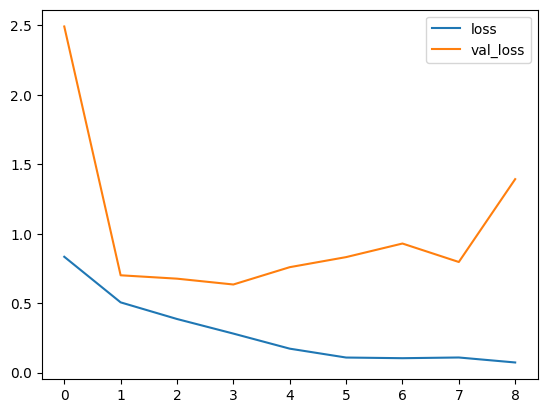

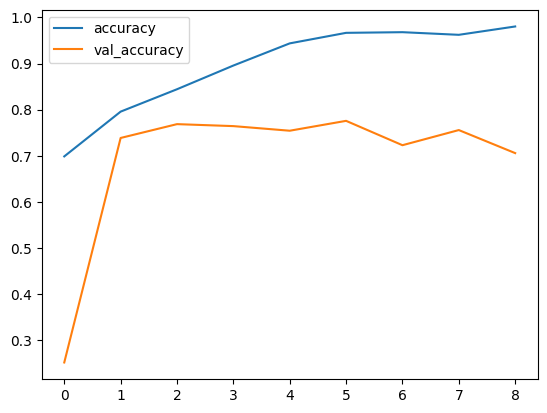

In [ ]:
# Plotting performance results
history_df_supp = pd.DataFrame(second_history_supp.history)
history_df_supp[['loss', 'val_loss']].plot()
history_df_supp[['accuracy', 'val_accuracy']].plot()

In [ ]:
# Prediction
trues = []
preds = []
for img, label in tqdm(test_data_supp):
  pred = second_model_supp.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

100%|██████████| 70/70 [00:26<00:00,  2.60it/s]


In [ ]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='macro'),3))
print("Recall score:", round(recall_score(trues, preds, average='macro', zero_division = 0),3))
print("Precision score:", round(precision_score(trues, preds, average='macro', zero_division = 0),3))

F1-Score: 0.775
Recall score: 0.788
Precision score: 0.788


In [ ]:
# Model loss value & metrics values in test mode
second_model_supp.evaluate(test_data_supp)

70/70 [==============================] - 23s 297ms/step - loss: 0.6225 - accuracy: 0.7514


[0.6225431561470032, 0.7514285445213318]

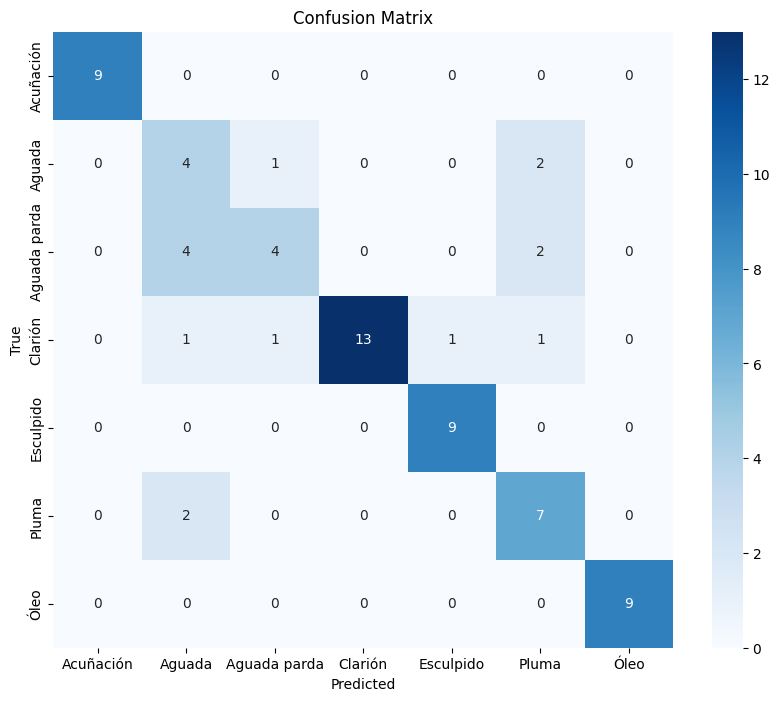

In [ ]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes_supp, yticklabels=classes_supp)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [ ]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     1.0000    1.0000    1.0000         9
           1     0.3636    0.5714    0.4444         7
           2     0.6667    0.4000    0.5000        10
           3     1.0000    0.7647    0.8667        17
           4     0.9000    1.0000    0.9474         9
           5     0.5833    0.7778    0.6667         9
           6     1.0000    1.0000    1.0000         9

    accuracy                         0.7857        70
   macro avg     0.7877    0.7877    0.7750        70
weighted avg     0.8223    0.7857    0.7910        70



In [ ]:
tf.keras.backend.clear_session()

## Third Model

In [ ]:
# Model definition
def third_model_supp():
  model = Sequential()
  #model.add(train_aug)
  model.add(layers.Rescaling(1./255, input_shape = (HEIGHT, WIDTH, 3)))
  model.add(layers.Conv2D(16, kernel_size=(3,3), padding = 'same', activation = 'relu'))
  model.add(layers.BatchNormalization())
  model.add(layers.MaxPooling2D())
  model.add(layers.Flatten())
  model.add(layers.Dense(len(classes_supp)))

  model.compile(optimizer = keras.optimizers.Adam(learning_rate=0.001),
                loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                metrics = ['accuracy'])

  return model

In [ ]:
third_model_supp = third_model_supp()
third_model_supp.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 64, 64, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 16)        448       
                                                                 
 batch_normalization (Batch  (None, 64, 64, 16)        64        
 Normalization)                                                  
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 16)        0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 16384)             0         
                                                                 
 dense (Dense)               (None, 7)                 1

In [ ]:
# Training
third_history_supp = third_model_supp.fit(train_data_supp,
                                          validation_data = validation_data_supp,
                                          epochs = EPOCHS,
                                          class_weight = weights_class_supp,
                                          callbacks=[early_stopping])

Epoch 1/10
210/210 [==============================] - 10s 43ms/step - loss: 1.6896 - accuracy: 0.6395 - val_loss: 1.5025 - val_accuracy: 0.5543
Epoch 2/10
210/210 [==============================] - 13s 61ms/step - loss: 0.7467 - accuracy: 0.7767 - val_loss: 2.0483 - val_accuracy: 0.5929
Epoch 3/10
210/210 [==============================] - 9s 44ms/step - loss: 0.3971 - accuracy: 0.8667 - val_loss: 0.9947 - val_accuracy: 0.7286
Epoch 4/10
210/210 [==============================] - 7s 35ms/step - loss: 0.2257 - accuracy: 0.9167 - val_loss: 1.5063 - val_accuracy: 0.7200
Epoch 5/10
210/210 [==============================] - 8s 40ms/step - loss: 0.1170 - accuracy: 0.9605 - val_loss: 1.2980 - val_accuracy: 0.7043
Epoch 6/10
210/210 [==============================] - 8s 40ms/step - loss: 0.1224 - accuracy: 0.9657 - val_loss: 1.8299 - val_accuracy: 0.6971
Epoch 7/10
210/210 [==============================] - 7s 35ms/step - loss: 0.0455 - accuracy: 0.9862 - val_loss: 1.3307 - val_accuracy: 0.71

<Axes: >

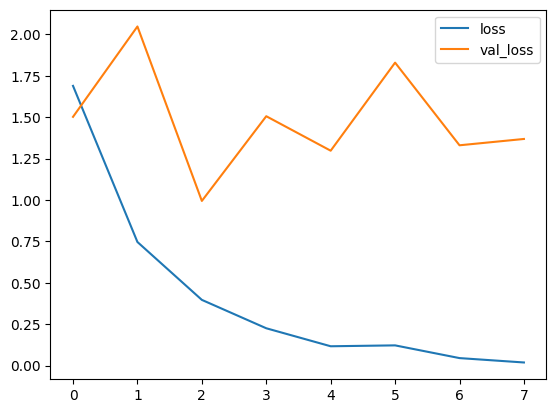

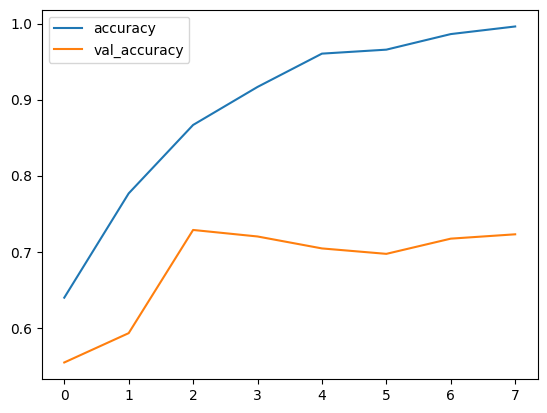

In [ ]:
# Plotting results
history_df_supp = pd.DataFrame(third_history_supp.history)
history_df_supp[['loss', 'val_loss']].plot()
history_df_supp[['accuracy', 'val_accuracy']].plot()

In [ ]:
# Prediction
trues = []
preds = []
for img, label in tqdm(test_data_supp):
  pred = third_model_supp.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

100%|██████████| 70/70 [00:40<00:00,  1.71it/s]


In [ ]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='macro'),3))
print("Recall score:", round(recall_score(trues, preds, average='macro', zero_division = 0),3))
print("Precision score:", round(precision_score(trues, preds, average='macro', zero_division = 0),3))

F1-Score: 0.677
Recall score: 0.679
Precision score: 0.754


In [ ]:
# Model loss value & metrics values in test mode
third_model_supp.evaluate(test_data_supp)

70/70 [==============================] - 21s 268ms/step - loss: 0.9667 - accuracy: 0.7086


[0.9666885137557983, 0.7085714340209961]

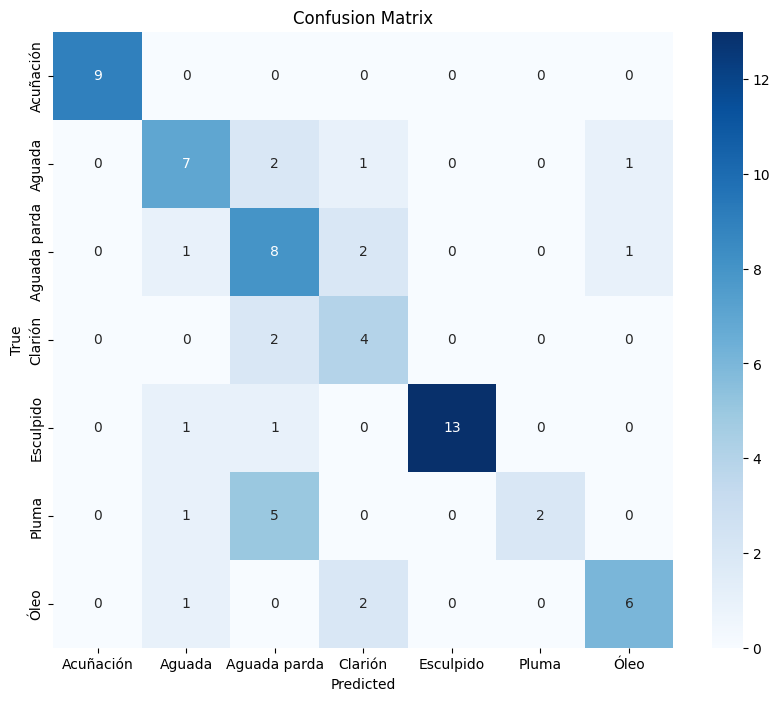

In [ ]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes_supp, yticklabels=classes_supp)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [ ]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     1.0000    1.0000    1.0000         9
           1     0.6364    0.6364    0.6364        11
           2     0.4444    0.6667    0.5333        12
           3     0.4444    0.6667    0.5333         6
           4     1.0000    0.8667    0.9286        15
           5     1.0000    0.2500    0.4000         8
           6     0.7500    0.6667    0.7059         9

    accuracy                         0.7000        70
   macro avg     0.7536    0.6790    0.6768        70
weighted avg     0.7679    0.7000    0.7012        70



In [ ]:
tf.keras.backend.clear_session()

## Hyper Parameter Model

In [ ]:
# Model definition
def build_model_supp(hp):
    # create model object
      model = Sequential()
      model.add(train_aug_supp)
      model.add(layers.Rescaling(1./255))

    #adding first convolutional layer
      model.add(layers.Conv2D(filters=hp.Int('conv_1_filter', min_value=16, max_value=128, step=16, sampling='linear'),
                              kernel_size=hp.Choice('conv_1_kernel', values = [3,5]),
                              activation='relu',
                              input_shape=(HEIGHT, WIDTH, 3)))
      model.add(layers.MaxPooling2D())

    # adding second convolutional layer
      model.add(layers.Conv2D(filters=hp.Int('conv_2_filter', min_value=16, max_value=128, step=16, sampling='linear'),
                              kernel_size=hp.Choice('conv_2_kernel', values = [3,5]),
                              activation='relu'))
      model.add(layers.MaxPooling2D())

    # adding third convolutional layer
      model.add(layers.Conv2D(filters=hp.Int('conv_3_filter', min_value=16, max_value=128, step=16, sampling='linear'),
                              kernel_size=hp.Choice('conv_3_kernel', values = [3,5]),
                              activation='relu'))
      model.add(layers.MaxPooling2D())
      model.add(layers.Flatten())

    # adding dense layer
      model.add(layers.Dense(units=hp.Int('dense_1_units', min_value=16, max_value=128, step=16, sampling='linear'),
                             activation='relu'))
      model.add(layers.Dense(units=hp.Int('dense_2_units', min_value=16, max_value=128, step=16, sampling='linear'),
                             activation='relu'))

    # output layer
      model.add(layers.Dense(len(classes_supp), activation='softmax'))

    #compilation of model
      model.compile(optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-3, 1e-4])),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])
      return model

tuner_supp_ = kt.Hyperband(
    build_model_supp,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='keras_tuner_dir',
    project_name='keras_tuner_demo_supp'
)

tuner_supp_.search(train_data_supp,
                   epochs=5,
                   validation_data=(validation_data_supp),
                   callbacks=[keras.callbacks.TensorBoard("/keras_tuner_dir_supp/tb_logs")])

#%tensorboard --logdir /keras_tuner_dir_supp/tb_logs

Trial 30 Complete [00h 08m 14s]
val_accuracy: 0.6528571248054504

Best val_accuracy So Far: 0.7599999904632568
Total elapsed time: 01h 43m 50s


In [ ]:
# Selecting best performing model
model_supp = tuner_supp_.get_best_models(num_models=1)[0]

# Summary of best model
#model.summary()

In [ ]:
# Training
hyper_history_supp = model_supp.fit(train_data_supp,
                                    epochs=EPOCHS,
                                    validation_data=(validation_data_supp))

Epoch 1/10
210/210 [==============================] - 46s 209ms/step - loss: 0.7047 - accuracy: 0.7352 - val_loss: 0.7113 - val_accuracy: 0.7629
Epoch 2/10
210/210 [==============================] - 43s 207ms/step - loss: 0.6804 - accuracy: 0.7476 - val_loss: 0.7853 - val_accuracy: 0.7043
Epoch 3/10
210/210 [==============================] - 43s 205ms/step - loss: 0.6557 - accuracy: 0.7533 - val_loss: 0.7043 - val_accuracy: 0.7500
Epoch 4/10
210/210 [==============================] - 43s 204ms/step - loss: 0.6379 - accuracy: 0.7581 - val_loss: 0.7061 - val_accuracy: 0.7300
Epoch 5/10
210/210 [==============================] - 39s 185ms/step - loss: 0.6333 - accuracy: 0.7595 - val_loss: 0.6264 - val_accuracy: 0.7814
Epoch 6/10
210/210 [==============================] - 39s 185ms/step - loss: 0.6398 - accuracy: 0.7595 - val_loss: 0.7456 - val_accuracy: 0.7357
Epoch 7/10
210/210 [==============================] - 39s 184ms/step - loss: 0.6135 - accuracy: 0.7695 - val_loss: 0.8710 - val_ac

<Axes: >

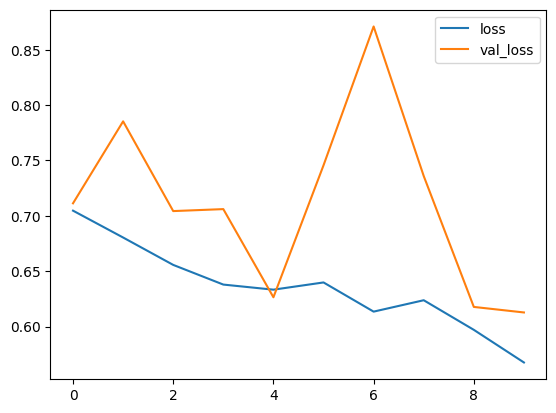

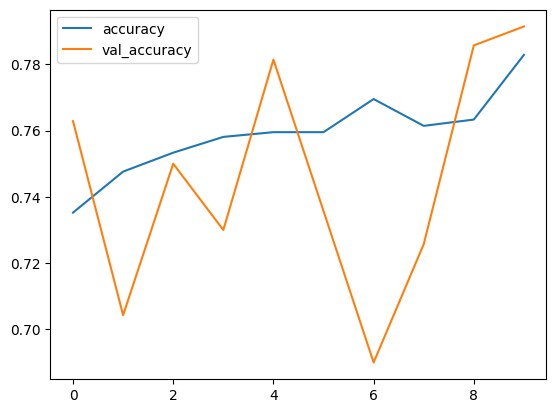

In [90]:
# Plotting results
history_df_supp = pd.DataFrame(hyper_history_supp.history)
history_df_supp[['loss', 'val_loss']].plot()
history_df_supp[['accuracy', 'val_accuracy']].plot()

In [91]:
# Prediction
trues = []
preds = []
for img, label in tqdm(test_data_supp):
  pred = model_supp.predict(img, verbose=0)
  pred = pred.argmax(axis=1)
  trues.append(label[0])
  preds.append(pred[0])

assert len(trues) == len(preds)

100%|██████████| 70/70 [01:21<00:00,  1.17s/it]


In [92]:
# Prediction measures results
print("F1-Score:", round(f1_score(trues, preds, average='macro'),3))
print("Recall score:", round(recall_score(trues, preds, average='macro', zero_division = 0),3))
print("Precision score:", round(precision_score(trues, preds, average='macro', zero_division = 0),3))

F1-Score: 0.809
Recall score: 0.83
Precision score: 0.812


In [93]:
# Model loss value & metrics values in test mode
model_supp.evaluate(test_data_supp)

70/70 [==============================] - 24s 316ms/step - loss: 0.5866 - accuracy: 0.7700


[0.5866028070449829, 0.7699999809265137]

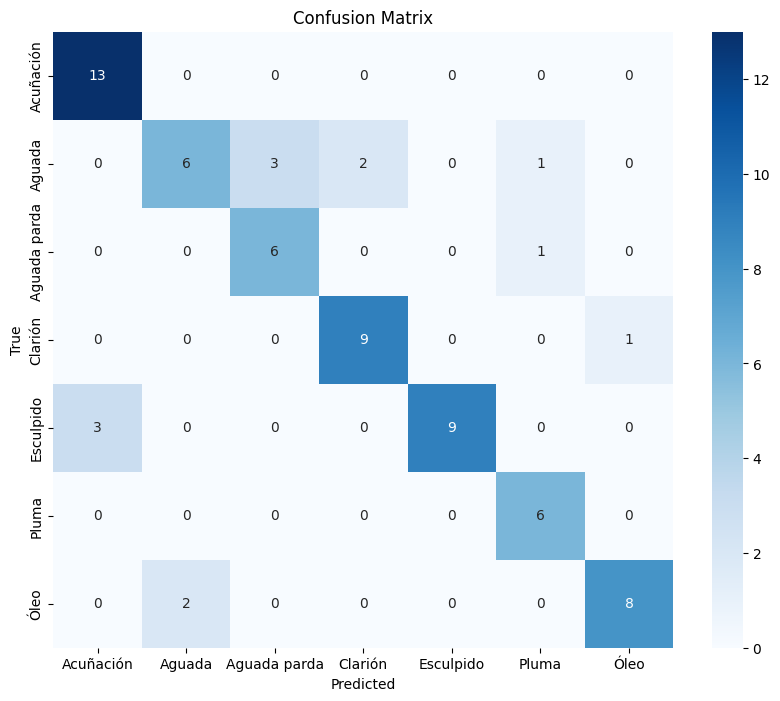

In [94]:
# Correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix(trues, preds), annot=True, cmap='Blues', xticklabels=classes_supp, yticklabels=classes_supp)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [95]:
print(classification_report(trues, preds, digits=4))

              precision    recall  f1-score   support

           0     0.8125    1.0000    0.8966        13
           1     0.7500    0.5000    0.6000        12
           2     0.6667    0.8571    0.7500         7
           3     0.8182    0.9000    0.8571        10
           4     1.0000    0.7500    0.8571        12
           5     0.7500    1.0000    0.8571         6
           6     0.8889    0.8000    0.8421        10

    accuracy                         0.8143        70
   macro avg     0.8123    0.8296    0.8086        70
weighted avg     0.8257    0.8143    0.8075        70



In [ ]:
tf.keras.backend.clear_session()

# Time

In [ ]:
end_time = time.time()
execution_time = round((end_time - start_time)/60)

print(f"Execution time: {execution_time} minutes")

Execution time: 144 minutes
Execution time: 144 minutes
